In [1]:
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

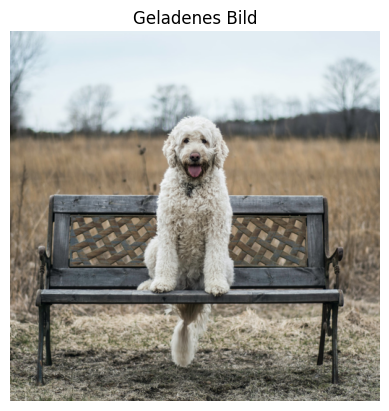

In [2]:
# Dateipfad angeben
file_path = 'images/image.png'

# Bild laden
image = cv2.imread(file_path)

# Bild anzeigen
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.title("Geladenes Bild")
plt.axis('off')
plt.show()

In [3]:
mask = cv2.imread('images/mask.png')

mask

array([[[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       ...,

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]]], shape=(512, 512, 3), dtype=uint8)

In [4]:
print(mask.shape)  # Sollte nur (Höhe, Breite) sein, nicht (Höhe, Breite, 3)
print(mask.dtype)  # Sollte `uint8` sein
print(np.unique(mask))  # Sollte nur Werte wie 0 und 255 enthalten


(512, 512, 3)
uint8
[  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17
  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35
  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53
  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71
  72  73  74  75  76  77  78  79  80  81  82  83  85  86  87  88  89  90
  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107 108
 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125 126
 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143 144
 145 146 147 148 149 150 151 152 153 154 155 157 158 159 160 161 162 163
 164 165 166 167 168 169 170 171 172 173 174 175 176 177 178 179 180 181
 182 183 184 185 186 187 188 189 190 191 192 193 194 195 196 197 198 199
 200 201 202 203 204 205 206 207 208 209 210 211 212 213 214 215 216 217
 218 219 220 221 222 223 224 225 226 227 228 229 230 231 232 233 234 235
 236 237 238 239 240 241 242 24

In [5]:
if len(mask.shape) == 3:
    mask = cv2.cvtColor(mask, cv2.COLOR_BGR2GRAY)


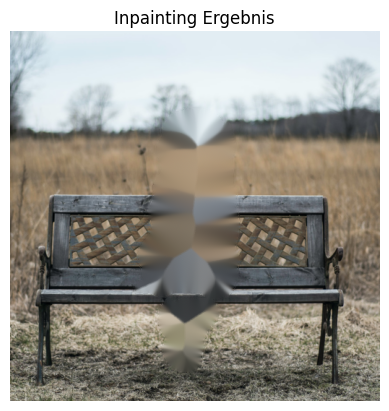

In [6]:
# Inpainting durchführen (falls nötig)
inpaint_result = cv2.inpaint(image, mask, inpaintRadius=3, flags=cv2.INPAINT_TELEA)

# Inpainting-Ergebnis anzeigen
plt.imshow(cv2.cvtColor(inpaint_result, cv2.COLOR_BGR2RGB))
plt.title("Inpainting Ergebnis")
plt.axis('off')
plt.show()

In [7]:
import os
print(os.path.exists('/images/instance_016_ADE_frame_00000079.png'))


False


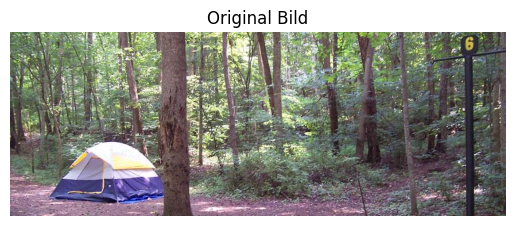

In [8]:
image_ade1 = cv2.imread('images/ADE_frame_00000079.jpg')


# Inpainting-Ergebnis anzeigen
plt.imshow(cv2.cvtColor(image_ade1, cv2.COLOR_BGR2RGB))
plt.title("Original Bild")
plt.axis('off')
plt.show()

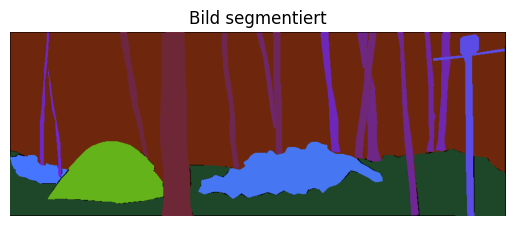

In [9]:
image_seg = cv2.imread('images/ADE_frame_00000079_seg.png')

# Inpainting-Ergebnis anzeigen
plt.imshow(cv2.cvtColor(image_seg, cv2.COLOR_BGR2RGB))
plt.title("Bild segmentiert")
plt.axis('off')
plt.show()

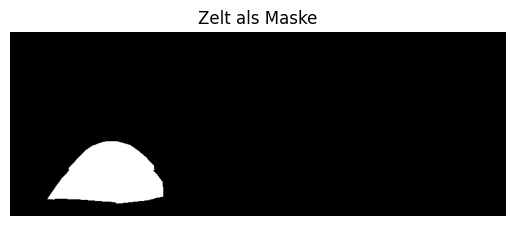

In [10]:
image_mask_tent = cv2.imread('images/instance_016_ADE_frame_00000079.png')


# Inpainting-Ergebnis anzeigen
plt.imshow(cv2.cvtColor(image_mask_tent, cv2.COLOR_BGR2RGB))
plt.title("Zelt als Maske")
plt.axis('off')
plt.show()

In [11]:
print(f"Maske Shape: {image_mask_tent.shape}")
print(f"Maske Datentyp: {image_mask_tent.dtype}")


Maske Shape: (320, 864, 3)
Maske Datentyp: uint8


In [12]:
if image_mask_tent.ndim == 3:  # Falls die Maske mehr als 1 Kanal hat
    image_mask_tent = cv2.cvtColor(image_mask_tent, cv2.COLOR_BGR2GRAY)

# Konvertiere Maske zu uint8
image_mask_tent = (image_mask_tent * 255).astype('uint8') if image_mask_tent.max() <= 1 else image_mask_tent.astype('uint8')


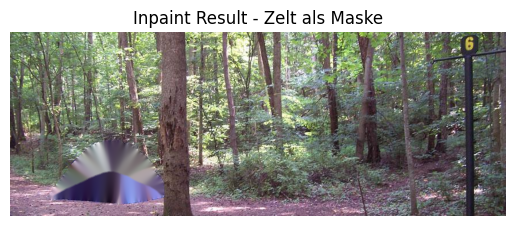

In [13]:
# Inpainting durchführen (falls nötig)
inpaint_result = cv2.inpaint(image_ade1, image_mask_tent, inpaintRadius=3, flags=cv2.INPAINT_TELEA)



# Inpainting-Ergebnis anzeigen
plt.imshow(cv2.cvtColor(inpaint_result, cv2.COLOR_BGR2RGB))
plt.title("Inpaint Result - Zelt als Maske")
plt.axis('off')
plt.show()


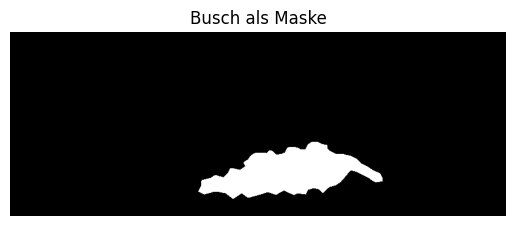

In [14]:
image_mask_bush = cv2.imread('images/instance_015_ADE_frame_00000079.png')


# Inpainting-Ergebnis anzeigen
plt.imshow(cv2.cvtColor(image_mask_bush, cv2.COLOR_BGR2RGB))
plt.title("Busch als Maske")
plt.axis('off')
plt.show()

In [15]:
if image_mask_bush.ndim == 3:  # Falls die Maske mehr als 1 Kanal hat
    image_mask_bush = cv2.cvtColor(image_mask_bush, cv2.COLOR_BGR2GRAY)

# Konvertiere Maske zu uint8
image_mask_bush = (image_mask_bush * 255).astype('uint8') if image_mask_bush.max() <= 1 else image_mask_bush.astype('uint8')

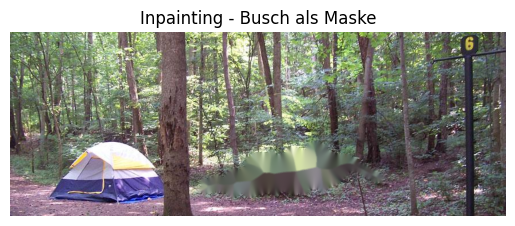

In [16]:

# Inpainting durchführen (falls nötig)
inpaint_result = cv2.inpaint(image_ade1, image_mask_bush, inpaintRadius=3, flags=cv2.INPAINT_TELEA)

# Inpainting-Ergebnis anzeigen
plt.imshow(cv2.cvtColor(inpaint_result, cv2.COLOR_BGR2RGB))
plt.title("Inpainting - Busch als Maske")
plt.axis('off')
plt.show()

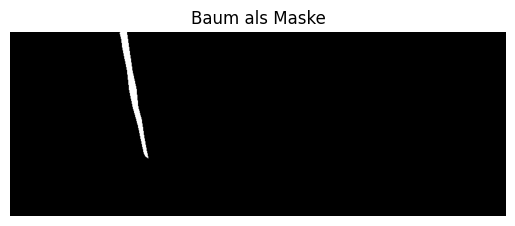

In [17]:
image_mask_stick = cv2.imread('images/instance_002_ADE_frame_00000079.png')

if image_mask_stick.ndim == 3:  # Falls die Maske mehr als 1 Kanal hat
    image_mask_stick = cv2.cvtColor(image_mask_stick, cv2.COLOR_BGR2GRAY)

# Konvertiere Maske zu uint8
image_mask_stick = (image_mask_stick * 255).astype('uint8') if image_mask_stick.max() <= 1 else image_mask_stick.astype('uint8')


# Inpainting-Ergebnis anzeigen
plt.imshow(cv2.cvtColor(image_mask_stick, cv2.COLOR_BGR2RGB))
plt.title("Baum als Maske")
plt.axis('off')
plt.show()


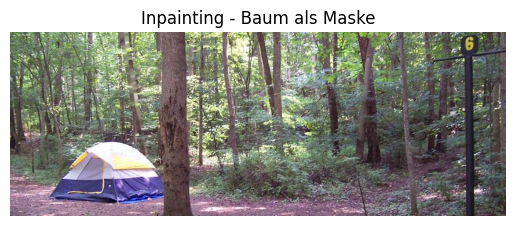

In [18]:

# Inpainting durchführen (falls nötig)
inpaint_result = cv2.inpaint(image_ade1, image_mask_stick, inpaintRadius=2, flags=cv2.INPAINT_TELEA)



# Inpainting-Ergebnis anzeigen
plt.imshow(cv2.cvtColor(inpaint_result, cv2.COLOR_BGR2RGB))
plt.title("Inpainting - Baum als Maske")
plt.axis('off')
plt.show()


1. StableDiffusionInpaintPipeline


In [19]:
from diffusers import AutoPipelineForInpainting
from diffusers.utils import load_image
from PIL import Image
import torch
import accelerate

# Pipeline laden
pipe = AutoPipelineForInpainting.from_pretrained(
    "stable-diffusion-v1-5/stable-diffusion-v1-5",
    torch_dtype=torch.float16  # Reduziert den Speicherverbrauch
)

# Pipeline auf die GPU verschieben
pipe = pipe.to("cuda")


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

In [20]:
print(pipe)


StableDiffusionInpaintPipeline {
  "_class_name": "StableDiffusionInpaintPipeline",
  "_diffusers_version": "0.32.1",
  "_name_or_path": "stable-diffusion-v1-5/stable-diffusion-v1-5",
  "feature_extractor": [
    "transformers",
    "CLIPImageProcessor"
  ],
  "image_encoder": [
    null,
    null
  ],
  "requires_safety_checker": true,
  "safety_checker": [
    "stable_diffusion",
    "StableDiffusionSafetyChecker"
  ],
  "scheduler": [
    "diffusers",
    "PNDMScheduler"
  ],
  "text_encoder": [
    "transformers",
    "CLIPTextModel"
  ],
  "tokenizer": [
    "transformers",
    "CLIPTokenizer"
  ],
  "unet": [
    "diffusers",
    "UNet2DConditionModel"
  ],
  "vae": [
    "diffusers",
    "AutoencoderKL"
  ]
}



In [21]:
from PIL import Image

# Bild als PIL-Objekt laden (z. B. aus einer Datei)
# Falls dein Bild bereits in `image_ade1` liegt, direkt konvertieren
image_original = Image.fromarray(image_ade1).convert("RGB")

# Maske als PIL-Objekt laden (z. B. aus einem NumPy-Array)
mask_original = Image.fromarray(image_mask_tent).convert("L")  # L für Graustufen


In [22]:
print(image_original.mode)  # Sollte 'RGB' sein
print(mask_original.mode)   # Sollte 'L' sein


RGB
L


In [23]:
# Prompt, der beschreibt, was in die Maske eingefügt werden soll
prompt = "A beautiful landscape with mountains and trees"

# Inpainting durchführen
result = pipe(prompt=prompt, image=image_original, mask_image=mask_original).images[0]

# Ergebnis speichern
result.save('images/inpainted_image.jpg')

# Ergebnis anzeigen
result.show()


  0%|          | 0/50 [00:00<?, ?it/s]

/bin/xdg-open: 882: www-browser: not found
/bin/xdg-open: 882: links2: not found
/bin/xdg-open: 882: elinks: not found
/bin/xdg-open: 882: links: not found
/bin/xdg-open: 882: lynx: not found
/bin/xdg-open: 882: w3m: not found
xdg-open: no method available for opening '/tmp/tmprqazl1z6.PNG'


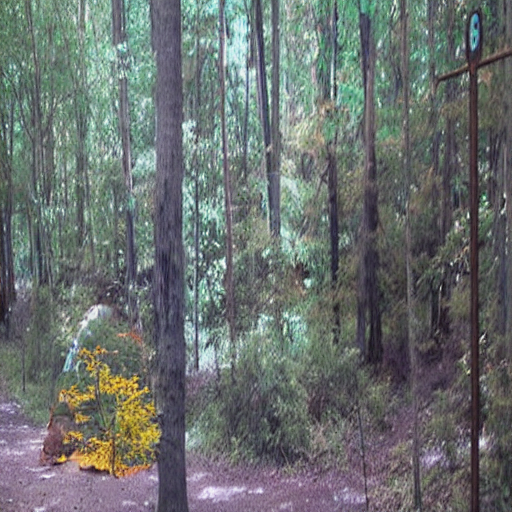

In [24]:
from IPython.display import display
display(result)


In [25]:
import os
print(os.path.exists('images/inpainted_image.jpg'))


True


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

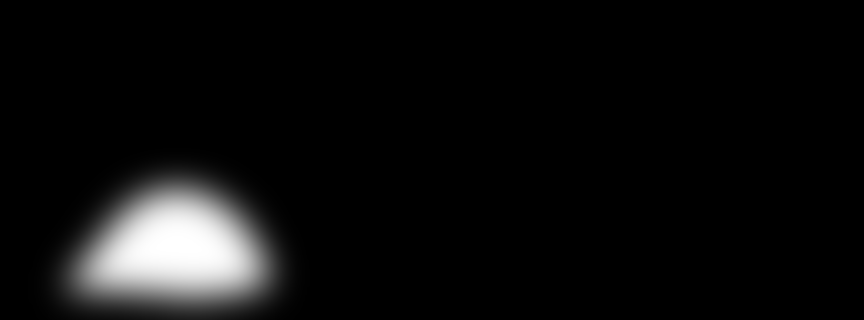

In [26]:
import torch
from diffusers import AutoPipelineForInpainting
from diffusers.utils import load_image
from PIL import Image

pipeline = AutoPipelineForInpainting.from_pretrained("stable-diffusion-v1-5/stable-diffusion-v1-5", torch_dtype=torch.float16).to('cuda')


blurred_mask = pipeline.mask_processor.blur(mask_original, blur_factor=17)
blurred_mask

In [27]:
# Prompt, der beschreibt, was in die Maske eingefügt werden soll
prompt = "A beautiful landscape with mountains and trees"

# Inpainting durchführen
result = pipe(prompt=prompt, image=image_original, mask_image=blurred_mask).images[0]

# Ergebnis speichern
result.save('images/inpainted_image_blurred_mask.jpg')

# Ergebnis anzeigen
result.show()

  0%|          | 0/50 [00:00<?, ?it/s]

/bin/xdg-open: 882: www-browser: not found
/bin/xdg-open: 882: links2: not found
/bin/xdg-open: 882: elinks: not found
/bin/xdg-open: 882: links: not found
/bin/xdg-open: 882: lynx: not found
/bin/xdg-open: 882: w3m: not found
xdg-open: no method available for opening '/tmp/tmpk25qhfoi.PNG'


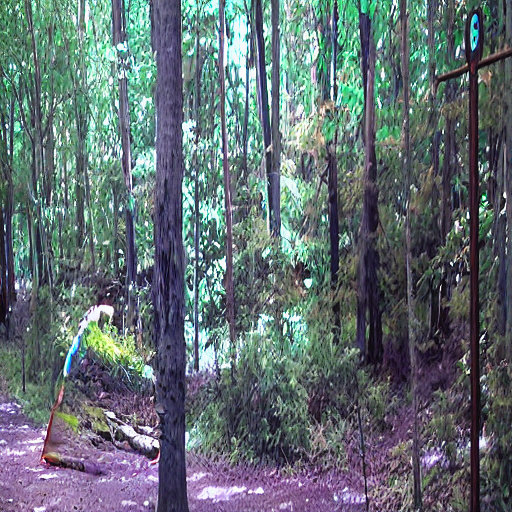

In [28]:
from IPython.display import display
display(result)


Loading pipeline components...:   0%|          | 0/3 [00:00<?, ?it/s]

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

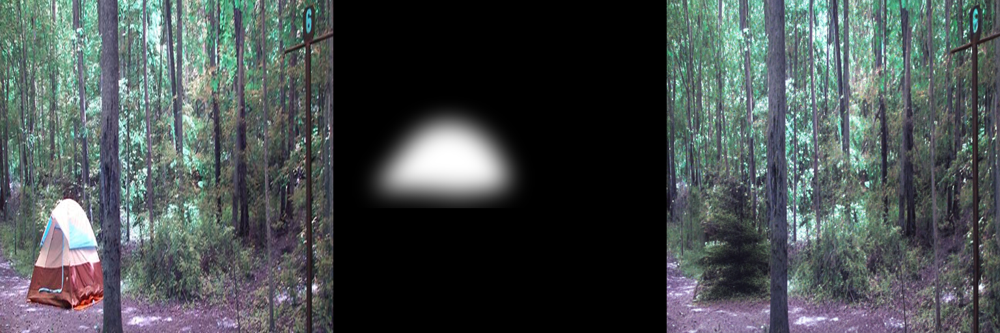

In [99]:
import torch
from diffusers import AutoPipelineForInpainting
from diffusers.utils import load_image, make_image_grid

pipeline = AutoPipelineForInpainting.from_pretrained(
    "kandinsky-community/kandinsky-2-2-decoder-inpaint", torch_dtype=torch.float16
)
pipeline.enable_model_cpu_offload()

generator = torch.Generator("cuda").manual_seed(92)
prompt = "trees in a forest"
image = pipeline(prompt=prompt, image=image_original, mask_image=blurred_mask, generator=generator).images[0]
make_image_grid([image_original, blurred_mask, image], rows=1, cols=3)


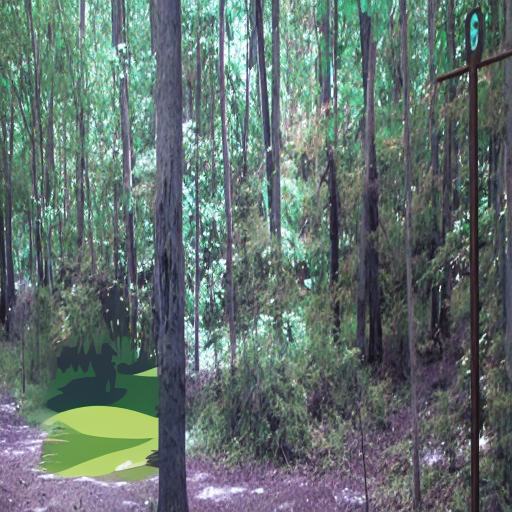

In [97]:
image.save('images/inpainted_image_blurred_mask_kadinsky.jpg')

display(image)

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

An error occurred while trying to fetch /home/ludo/.cache/huggingface/hub/models--runwayml--stable-diffusion-inpainting/snapshots/8a4288a76071f7280aedbdb3253bdb9e9d5d84bb/vae: Error no file named diffusion_pytorch_model.safetensors found in directory /home/ludo/.cache/huggingface/hub/models--runwayml--stable-diffusion-inpainting/snapshots/8a4288a76071f7280aedbdb3253bdb9e9d5d84bb/vae.
Defaulting to unsafe serialization. Pass `allow_pickle=False` to raise an error instead.
An error occurred while trying to fetch /home/ludo/.cache/huggingface/hub/models--runwayml--stable-diffusion-inpainting/snapshots/8a4288a76071f7280aedbdb3253bdb9e9d5d84bb/unet: Error no file named diffusion_pytorch_model.safetensors found in directory /home/ludo/.cache/huggingface/hub/models--runwayml--stable-diffusion-inpainting/snapshots/8a4288a76071f7280aedbdb3253bdb9e9d5d84bb/unet.
Defaulting to unsafe serialization. Pass `allow_pickle=False` to raise an error instead.


  0%|          | 0/50 [00:00<?, ?it/s]

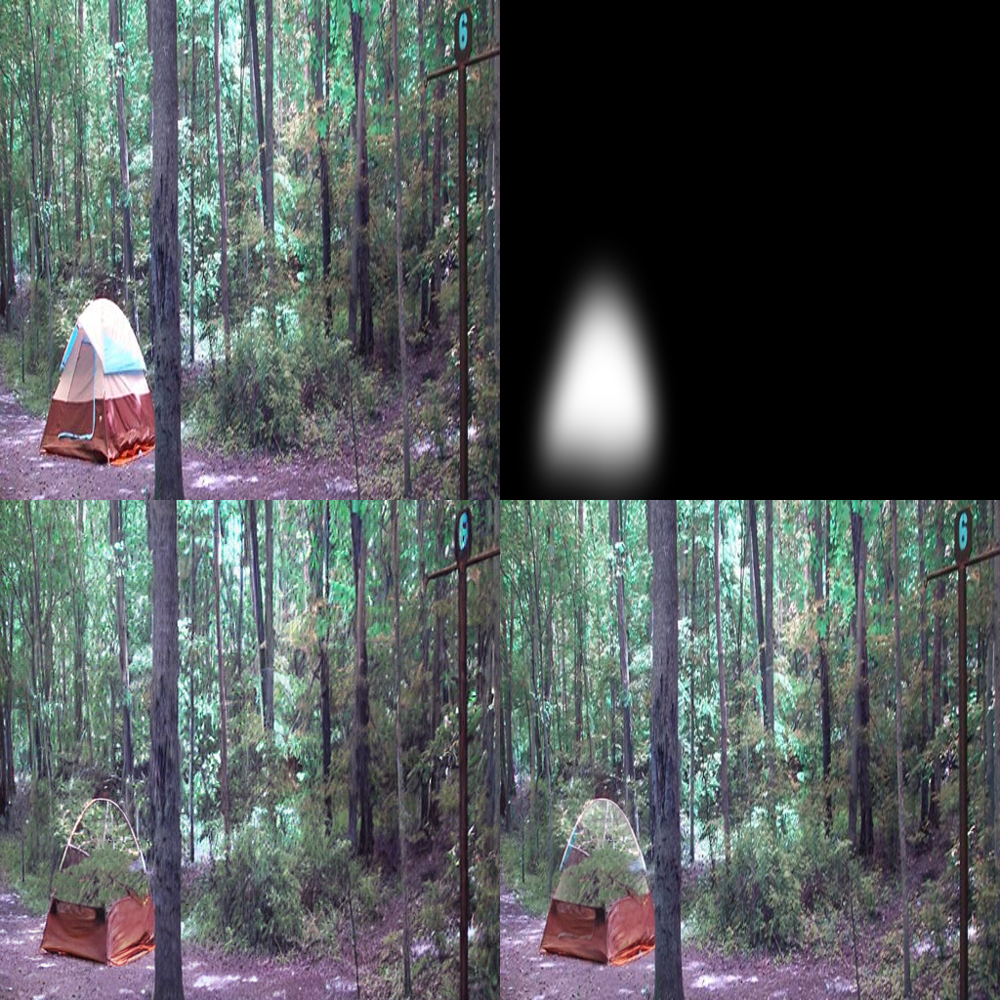

In [41]:
import PIL
import numpy as np
import torch

from diffusers import AutoPipelineForInpainting
from diffusers.utils import load_image, make_image_grid

device = "cuda"
pipeline = AutoPipelineForInpainting.from_pretrained(
    "runwayml/stable-diffusion-inpainting",
    torch_dtype=torch.float16,
)
pipeline = pipeline.to(device)

image_original = load_image(image_original).resize((512, 512))
mask_original = load_image(blurred_mask).resize((512, 512))

prompt = "create dark green forest in nature, 8k"
repainted_image = pipeline(prompt=prompt, image=image_original, mask_image=mask_original).images[0]
repainted_image.save("images/repainted_image.png")

unmasked_unchanged_image = pipeline.image_processor.apply_overlay(mask_original, image_original, repainted_image)
unmasked_unchanged_image.save("force_unmasked_unchanged.png")
make_image_grid([image_original, mask_original, repainted_image, unmasked_unchanged_image], rows=2, cols=2)

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

An error occurred while trying to fetch /home/ludo/.cache/huggingface/hub/models--runwayml--stable-diffusion-inpainting/snapshots/8a4288a76071f7280aedbdb3253bdb9e9d5d84bb/vae: Error no file named diffusion_pytorch_model.safetensors found in directory /home/ludo/.cache/huggingface/hub/models--runwayml--stable-diffusion-inpainting/snapshots/8a4288a76071f7280aedbdb3253bdb9e9d5d84bb/vae.
Defaulting to unsafe serialization. Pass `allow_pickle=False` to raise an error instead.
An error occurred while trying to fetch /home/ludo/.cache/huggingface/hub/models--runwayml--stable-diffusion-inpainting/snapshots/8a4288a76071f7280aedbdb3253bdb9e9d5d84bb/unet: Error no file named diffusion_pytorch_model.safetensors found in directory /home/ludo/.cache/huggingface/hub/models--runwayml--stable-diffusion-inpainting/snapshots/8a4288a76071f7280aedbdb3253bdb9e9d5d84bb/unet.
Defaulting to unsafe serialization. Pass `allow_pickle=False` to raise an error instead.


  0%|          | 0/50 [00:00<?, ?it/s]

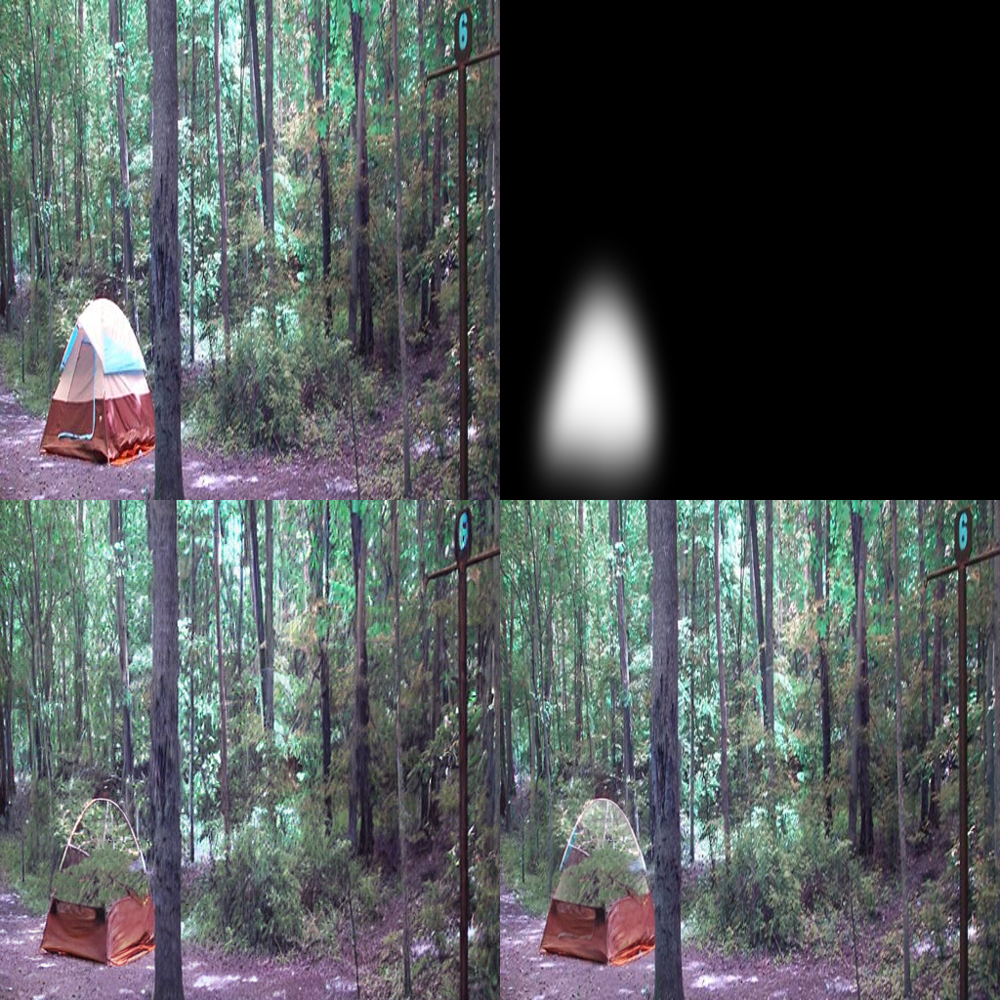

In [41]:
import PIL
import numpy as np
import torch

from diffusers import AutoPipelineForInpainting
from diffusers.utils import load_image, make_image_grid

device = "cuda"
pipeline = AutoPipelineForInpainting.from_pretrained(
    "runwayml/stable-diffusion-inpainting",
    torch_dtype=torch.float16,
)
pipeline = pipeline.to(device)

image_original = load_image(image_original).resize((512, 512))
mask_original = load_image(blurred_mask).resize((512, 512))

prompt = "create dark green forest in nature, 8k"
repainted_image = pipeline(prompt=prompt, image=image_original, mask_image=mask_original).images[0]
repainted_image.save("images/repainted_image.png")

unmasked_unchanged_image = pipeline.image_processor.apply_overlay(mask_original, image_original, repainted_image)
unmasked_unchanged_image.save("force_unmasked_unchanged.png")
make_image_grid([image_original, mask_original, repainted_image, unmasked_unchanged_image], rows=2, cols=2)

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

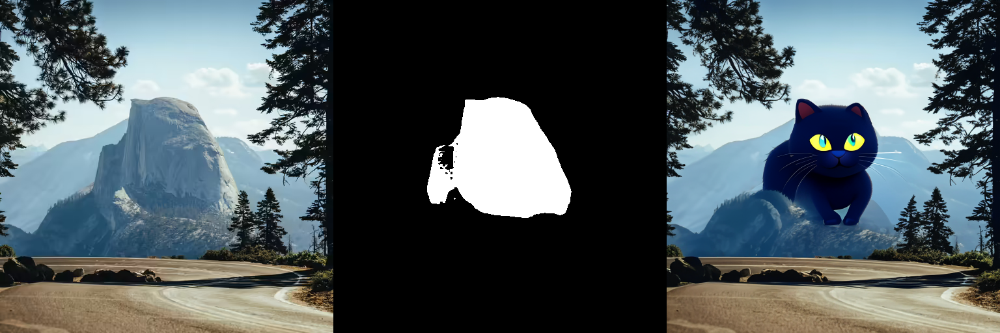

In [104]:
init_image = load_image("https://huggingface.co/datasets/huggingface/documentation-images/resolve/main/diffusers/inpaint.png")
mask_image = load_image("https://huggingface.co/datasets/huggingface/documentation-images/resolve/main/diffusers/inpaint_mask.png")

prompt = "a black cat with glowing eyes, cute, adorable, disney, pixar, highly detailed, 8k"
negative_prompt = "bad anatomy, deformed, ugly, disfigured"
image = pipeline(prompt=prompt, negative_prompt=negative_prompt, image=init_image, mask_image=mask_image).images[0]
make_image_grid([init_image, mask_image, image], rows=1, cols=3)

In [44]:
## Strength

'''
strength is a measure of how much noise is added to the base image, which influences how similar the output is to the base image.

📈 a high strength value means more noise is added to an image and the denoising process takes longer, but you’ll get higher quality images that are more different from the base image
📉 a low strength value means less noise is added to an image and the denoising process is faster, but the image quality may not be as great and the generated image resembles the base image more
'''

# guidance_scale affects how aligned the text prompt and generated image are.

'''

📈 a high guidance_scale value means the prompt and generated image are closely aligned, so the output is a stricter interpretation of the prompt
📉 a low guidance_scale value means the prompt and generated image are more loosely aligned, so the output may be more varied from the prompt
You can use strength and guidance_scale together for more control over how expressive the model is. For example, a combination high strength and guidance_scale values gives the model the most creative freedom.

'''

'''
A negative prompt assumes the opposite role of a prompt; it guides the model away from generating certain things in an image. This is useful for quickly improving image quality and preventing the model from generating things you don’t want.
'''




'\nstrength is a measure of how much noise is added to the base image, which influences how similar the output is to the base image.\n\n📈 a high strength value means more noise is added to an image and the denoising process takes longer, but you’ll get higher quality images that are more different from the base image\n📉 a low strength value means less noise is added to an image and the denoising process is faster, but the image quality may not be as great and the generated image resembles the base image more\n'

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

An error occurred while trying to fetch /home/ludo/.cache/huggingface/hub/models--runwayml--stable-diffusion-inpainting/snapshots/8a4288a76071f7280aedbdb3253bdb9e9d5d84bb/vae: Error no file named diffusion_pytorch_model.safetensors found in directory /home/ludo/.cache/huggingface/hub/models--runwayml--stable-diffusion-inpainting/snapshots/8a4288a76071f7280aedbdb3253bdb9e9d5d84bb/vae.
Defaulting to unsafe serialization. Pass `allow_pickle=False` to raise an error instead.
An error occurred while trying to fetch /home/ludo/.cache/huggingface/hub/models--runwayml--stable-diffusion-inpainting/snapshots/8a4288a76071f7280aedbdb3253bdb9e9d5d84bb/unet: Error no file named diffusion_pytorch_model.safetensors found in directory /home/ludo/.cache/huggingface/hub/models--runwayml--stable-diffusion-inpainting/snapshots/8a4288a76071f7280aedbdb3253bdb9e9d5d84bb/unet.
Defaulting to unsafe serialization. Pass `allow_pickle=False` to raise an error instead.


  0%|          | 0/35 [00:00<?, ?it/s]

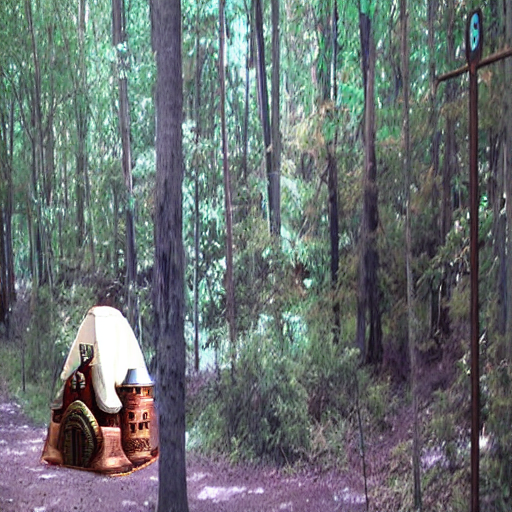

In [59]:

pipeline = AutoPipelineForInpainting.from_pretrained(
    "runwayml/stable-diffusion-inpainting", torch_dtype=torch.float16
)
pipeline.enable_model_cpu_offload()

generator = torch.Generator("cuda").manual_seed(92)
prompt = "create a castle like in lord of the rings, highly detailed, 8k"
negative_prompt = "bad architecture, unstable, poor details, blurry"
image = pipeline(prompt=prompt, 
                 negative_prompt=negative_prompt,
                 image=image_original, 
                 mask_image=blurred_mask, 
                 generator=generator, 
                 strength = 0.7, 
                 guidance_scale=22
                ).images[0]
display(image)


In [ ]:
'''
Padding mask crop
A method for increasing the inpainting image quality is to use the padding_mask_crop parameter. When enabled, this option crops the masked area with some user-specified padding and it’ll also crop the same area from the original image. Both the image and mask are upscaled to a higher resolution for inpainting, and then overlaid on the original image. This is a quick and easy way to improve image quality without using a separate pipeline like StableDiffusionUpscalePipeline.

Add the padding_mask_crop parameter to the pipeline call and set it to the desired padding value.
'''

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

An error occurred while trying to fetch /home/ludo/.cache/huggingface/hub/models--runwayml--stable-diffusion-inpainting/snapshots/8a4288a76071f7280aedbdb3253bdb9e9d5d84bb/vae: Error no file named diffusion_pytorch_model.safetensors found in directory /home/ludo/.cache/huggingface/hub/models--runwayml--stable-diffusion-inpainting/snapshots/8a4288a76071f7280aedbdb3253bdb9e9d5d84bb/vae.
Defaulting to unsafe serialization. Pass `allow_pickle=False` to raise an error instead.
An error occurred while trying to fetch /home/ludo/.cache/huggingface/hub/models--runwayml--stable-diffusion-inpainting/snapshots/8a4288a76071f7280aedbdb3253bdb9e9d5d84bb/unet: Error no file named diffusion_pytorch_model.safetensors found in directory /home/ludo/.cache/huggingface/hub/models--runwayml--stable-diffusion-inpainting/snapshots/8a4288a76071f7280aedbdb3253bdb9e9d5d84bb/unet.
Defaulting to unsafe serialization. Pass `allow_pickle=False` to raise an error instead.


  0%|          | 0/50 [00:00<?, ?it/s]

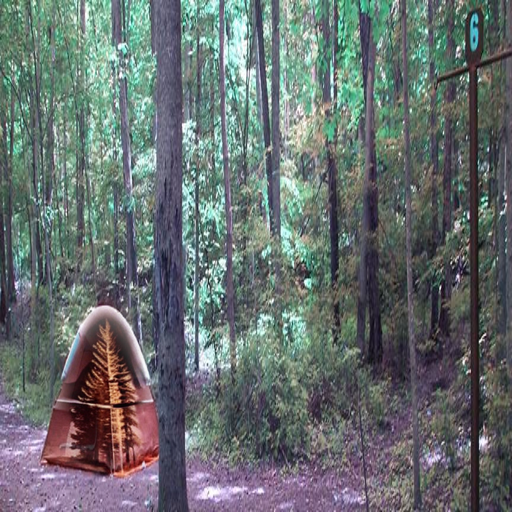

In [66]:

pipeline = AutoPipelineForInpainting.from_pretrained(
    "runwayml/stable-diffusion-inpainting", torch_dtype=torch.float16
)
pipeline.enable_model_cpu_offload()

generator = torch.Generator("cuda").manual_seed(92)
prompt = "create a forest with high trees in nature, highly detailed, 8k"
image = pipeline(prompt=prompt, image=image_original, mask_image=mask_original, generator=generator, padding_mask_crop=15).images[0]
display(image)